## **Principal Component Analysis of heart attack prediction Dataset**

In [1]:
!pip install pycaret==3.0.0

  Using cached pycaret-3.0.0-py3-none-any.whl (481 kB)
  Attempting uninstall: pycaret
    Found existing installation: pycaret 3.2.0
    Uninstalling pycaret-3.2.0:
      Successfully uninstalled pycaret-3.2.0


In [2]:
from pycaret.utils import version
version()

'3.0.0'

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [4]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.5.3
Seaborn version:  0.12.2


In [5]:
df = pd.read_csv('https://github.com/sr030529/heartattack/raw/main/heart_attack_prediction_dataset(AutoRecovered)%20(1).csv')
df.head(25)

,Age,BMI,Heart Rate,Cholesterol,Family History,Alcohol Consumption,Diabetes,Obesity,Smoking,Medication Use,Stress Level,Previous Heart Problems,Target
0,67,31.251233,72,208,0,0,0,0,1,0,9,0,0
1,21,27.194973,98,389,1,1,1,1,1,0,1,1,0
2,21,28.176571,72,324,0,0,1,0,0,1,9,1,0
3,84,36.464704,73,383,1,1,1,0,1,0,9,1,0
4,66,21.809144,93,318,1,0,1,1,1,0,6,1,0
5,54,20.146839,48,297,1,1,1,0,1,1,2,1,1
6,90,28.885811,84,358,0,1,0,0,1,0,7,0,1
7,84,22.221862,107,220,0,1,0,1,1,1,4,0,1
8,20,35.809901,68,145,0,0,1,1,1,0,5,0,0
9,43,22.558917,55,248,1,1,0,1,1,0,4,0,0


In [6]:
len(df.index)

8763

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      8763 non-null   int64  
 1   BMI                      8763 non-null   float64
 2   Heart Rate               8763 non-null   int64  
 3   Cholesterol              8763 non-null   int64  
 4   Family History           8763 non-null   int64  
 5   Alcohol Consumption      8763 non-null   int64  
 6   Diabetes                 8763 non-null   int64  
 7   Obesity                  8763 non-null   int64  
 8   Smoking                  8763 non-null   int64  
 9   Medication Use           8763 non-null   int64  
 10  Stress Level             8763 non-null   int64  
 11  Previous Heart Problems  8763 non-null   int64  
 12  Target                   8763 non-null   int64  
dtypes: float64(1), int64(12)
memory usage: 890.1 KB


In [8]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [9]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

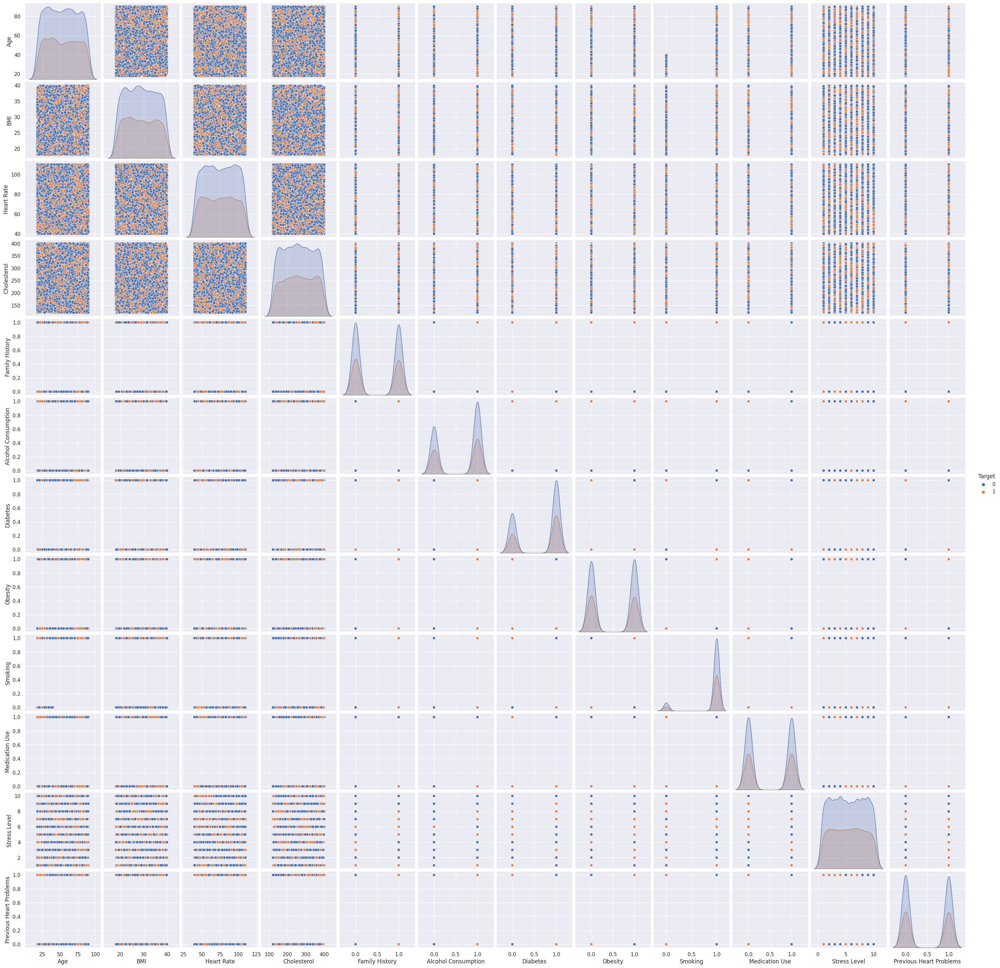

In [10]:
sns.pairplot(df, hue='Target')
plt.show()

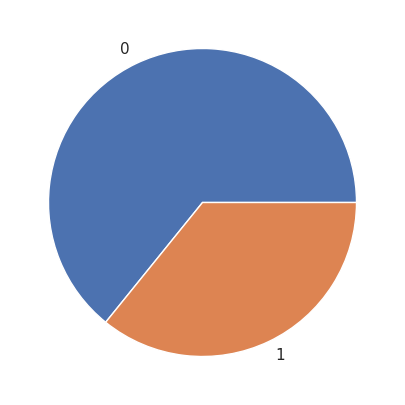

In [11]:
y =df['Target']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [12]:
X = df.drop(columns=['Target'])
X.head(10)

,Age,BMI,Heart Rate,Cholesterol,Family History,Alcohol Consumption,Diabetes,Obesity,Smoking,Medication Use,Stress Level,Previous Heart Problems
0,67,31.251233,72,208,0,0,0,0,1,0,9,0
1,21,27.194973,98,389,1,1,1,1,1,0,1,1
2,21,28.176571,72,324,0,0,1,0,0,1,9,1
3,84,36.464704,73,383,1,1,1,0,1,0,9,1
4,66,21.809144,93,318,1,0,1,1,1,0,6,1
5,54,20.146839,48,297,1,1,1,0,1,1,2,1
6,90,28.885811,84,358,0,1,0,0,1,0,7,0
7,84,22.221862,107,220,0,1,0,1,1,1,4,0
8,20,35.809901,68,145,0,0,1,1,1,0,5,0
9,43,22.558917,55,248,1,1,0,1,1,0,4,0


In [13]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Age,8763.0,53.707977,21.249509,18.000000,35.000000,54.000000,72.000000,90.000000
BMI,8763.0,28.891446,6.319181,18.002337,23.422985,28.768999,34.324594,39.997211
Heart Rate,8763.0,75.021682,20.550948,40.000000,57.000000,75.000000,93.000000,110.000000
Cholesterol,8763.0,259.877211,80.863276,120.000000,192.000000,259.000000,330.000000,400.000000
Family History,8763.0,0.492982,0.499979,0.000000,0.000000,0.000000,1.000000,1.000000
Alcohol Consumption,8763.0,0.598083,0.490313,0.000000,0.000000,1.000000,1.000000,1.000000
Diabetes,8763.0,0.652288,0.476271,0.000000,0.000000,1.000000,1.000000,1.000000
Obesity,8763.0,0.501426,0.500026,0.000000,0.000000,1.000000,1.000000,1.000000
Smoking,8763.0,0.896839,0.304186,0.000000,1.000000,1.000000,1.000000,1.000000
Medication Use,8763.0,0.498345,0.500026,0.000000,0.000000,0.000000,1.000000,1.000000


**Standardize the Data**

In [14]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Age,BMI,Heart Rate,Cholesterol,Family History,Alcohol Consumption,Diabetes,Obesity,Smoking,Medication Use,Stress Level,Previous Heart Problems
0,0.625557,0.373454,-0.147042,-0.641579,-0.986061,-1.219867,-1.369651,-1.002857,0.339157,-0.996696,1.234604,-0.991704
1,-1.539322,-0.268479,1.118179,1.596895,1.014136,0.819762,0.730113,0.997151,0.339157,-0.996696,-1.563129,1.008365
2,-1.539322,-0.113134,-0.147042,0.793023,-0.986061,-1.219867,0.730113,-1.002857,-2.948488,1.003315,1.234604,1.008365
3,1.425621,1.198524,-0.098380,1.522691,1.014136,0.819762,0.730113,-1.002857,0.339157,-0.996696,1.234604,1.008365
4,0.578495,-1.120826,0.874867,0.718820,1.014136,-1.219867,0.730113,0.997151,0.339157,-0.996696,0.185454,1.008365
5,0.013743,-1.383898,-1.314938,0.459107,1.014136,0.819762,0.730113,-1.002857,0.339157,1.003315,-1.213412,1.008365
6,1.707997,-0.000892,0.436906,1.213510,-0.986061,0.819762,-1.369651,-1.002857,0.339157,-0.996696,0.535170,-0.991704
7,1.425621,-1.055511,1.556140,-0.493172,-0.986061,0.819762,-1.369651,0.997151,0.339157,1.003315,-0.513979,-0.991704
8,-1.586385,1.094897,-0.341691,-1.420716,-0.986061,-1.219867,0.730113,0.997151,0.339157,-0.996696,-0.164263,-0.991704
9,-0.503945,-1.002169,-0.974302,-0.146889,1.014136,0.819762,-1.369651,0.997151,0.339157,-0.996696,-0.513979,-0.991704


In [15]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Age,8763.0,-5.756994e-17,1.000057,-1.680510,-0.880446,0.013743,0.860870,1.707997
BMI,8763.0,-8.676032e-17,1.000057,-1.723282,-0.865424,-0.019378,0.859836,1.757569
Heart Rate,8763.0,1.763586e-16,1.000057,-1.704237,-0.876977,-0.001055,0.874867,1.702127
Cholesterol,8763.0,5.594825e-17,1.000057,-1.729898,-0.839455,-0.010849,0.867227,1.732935
Family History,8763.0,-9.152403e-17,1.000057,-0.986061,-0.986061,-0.986061,1.014136,1.014136
Alcohol Consumption,8763.0,1.392625e-16,1.000057,-1.219867,-1.219867,0.819762,0.819762,0.819762
Diabetes,8763.0,-5.331300e-17,1.000057,-1.369651,-1.369651,0.730113,0.730113,0.730113
Obesity,8763.0,9.121997e-17,1.000057,-1.002857,-1.002857,0.997151,0.997151,0.997151
Smoking,8763.0,1.465601e-16,1.000057,-2.948488,0.339157,0.339157,0.339157,0.339157
Medication Use,8763.0,1.402760e-16,1.000057,-0.996696,-0.996696,-0.996696,1.003315,1.003315


**Observations and variables**

In [16]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

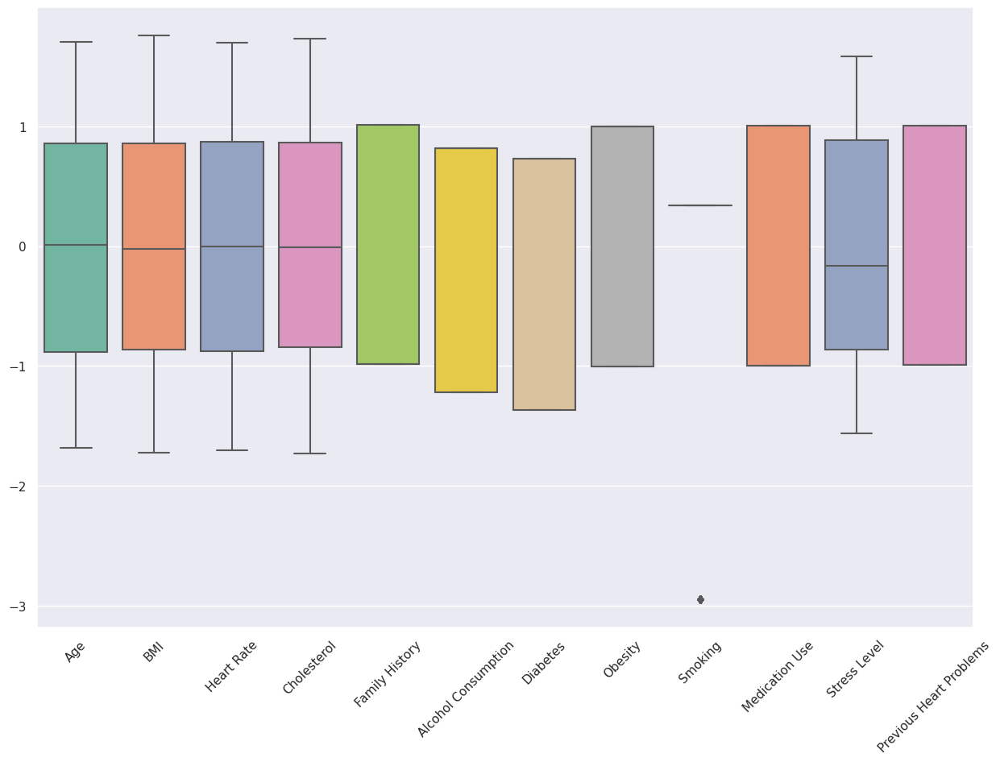

In [17]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

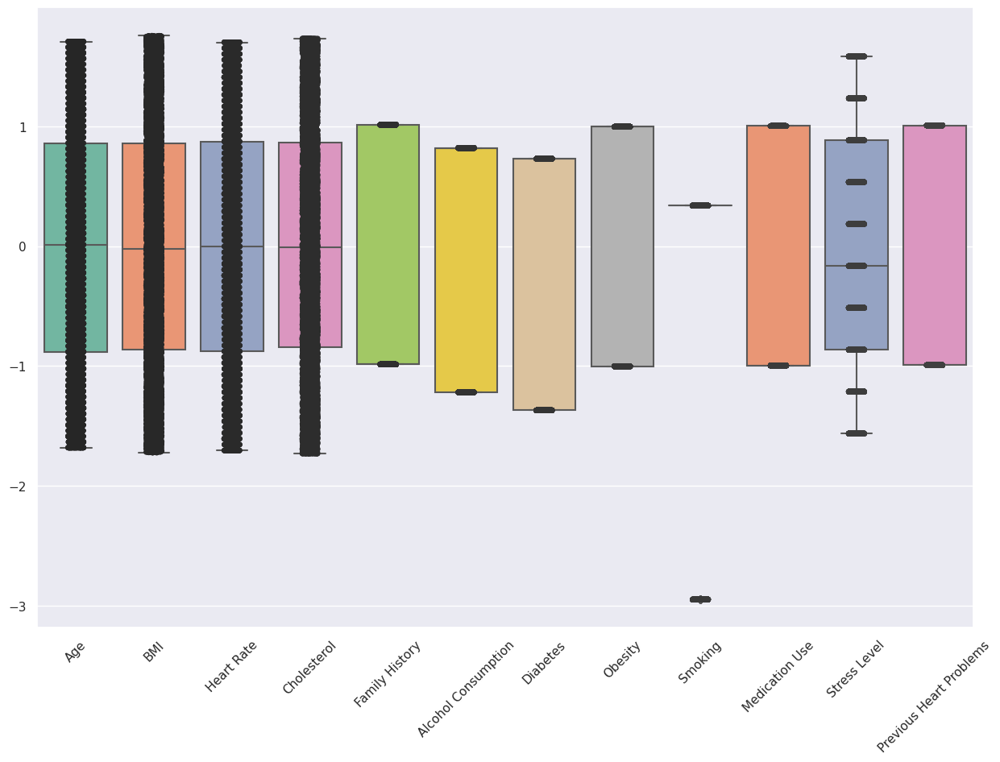

In [18]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

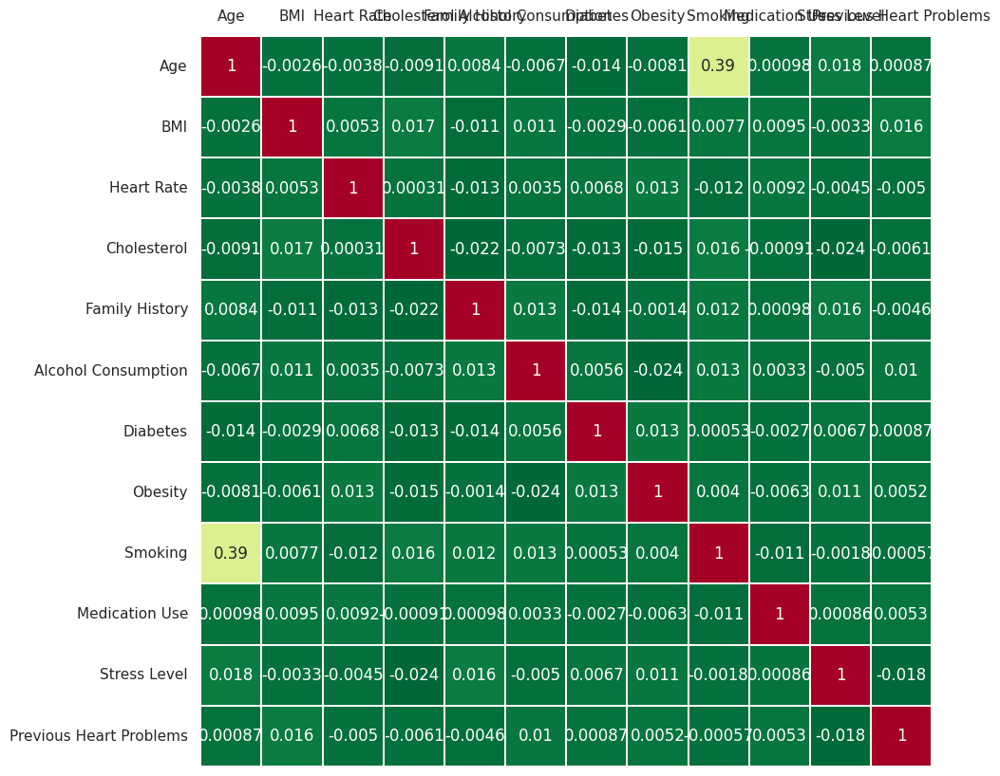

In [19]:
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

# Principal Component Analysis (PCA)

Text(0, 0.5, 'Z2')

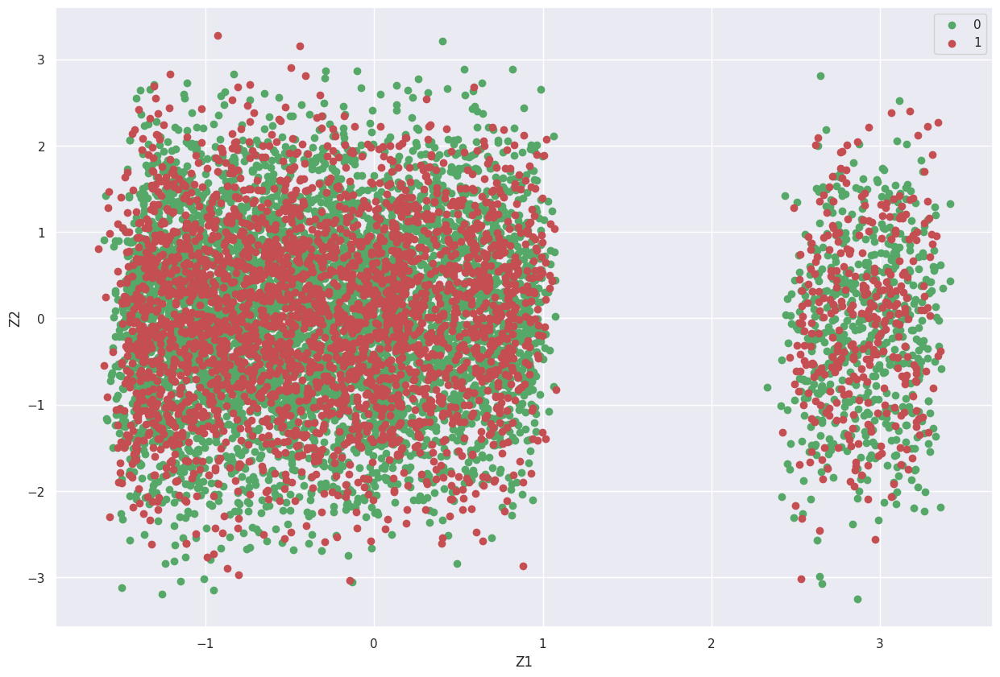

In [20]:
pca = PCA()
Z = pca.fit_transform(X)


idx_0= np.where(y == 0)
idx_1 = np.where(y == 1)


plt. figure(figsize=(15,10))
plt.scatter(Z[idx_0,0], Z[idx_0,1], c='g', label='0')
plt.scatter(Z[idx_1,0], Z[idx_1,1], c='r', label='1')


plt.legend()
plt.xlabel('Z1')
plt.ylabel('Z2')

**Eigenvectors**

array([[-0.70538381, -0.0119288 , -0.03071903, -0.01448279, -0.02414157,
         0.01160202, -0.02347411, -0.02979446,  0.04694443,  0.02200726,
         0.00377127,  0.70447107],
       [-0.00785376,  0.39731893,  0.00610056, -0.29286886, -0.13787186,
         0.20883779,  0.59188195,  0.388923  , -0.11368979,  0.4024517 ,
        -0.12993798,  0.01681546],
       [ 0.03134812,  0.06955057, -0.35145248, -0.30590621, -0.46832798,
        -0.11193115, -0.47928359,  0.4173665 ,  0.16655135,  0.06802533,
         0.32965779, -0.01656075],
       [-0.01033224,  0.52268671, -0.14193569,  0.3797508 , -0.10803119,
        -0.05592479,  0.1221952 ,  0.06129762, -0.41281151, -0.49580843,
         0.33251096,  0.04522359],
       [-0.03846805, -0.34425914,  0.51495361,  0.0159181 , -0.01165253,
         0.2001484 , -0.16390343,  0.26020145, -0.55707657,  0.18548654,
         0.36739405,  0.00964378],
       [-0.01148046,  0.14531159,  0.47823778, -0.42593273, -0.00969663,
        -0.42741803, -

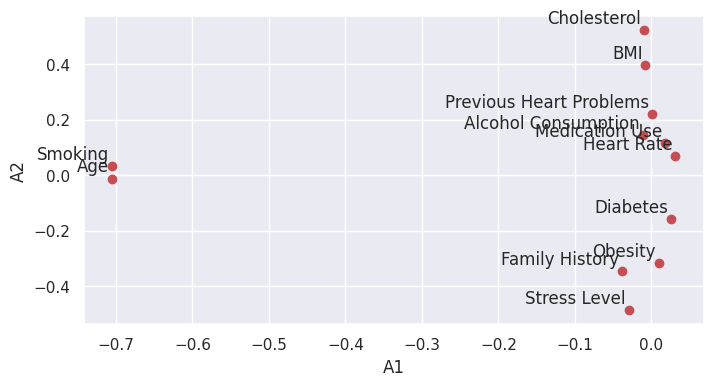

In [21]:
A = pca.components_.T
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('A1')
plt.ylabel('A2')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
A


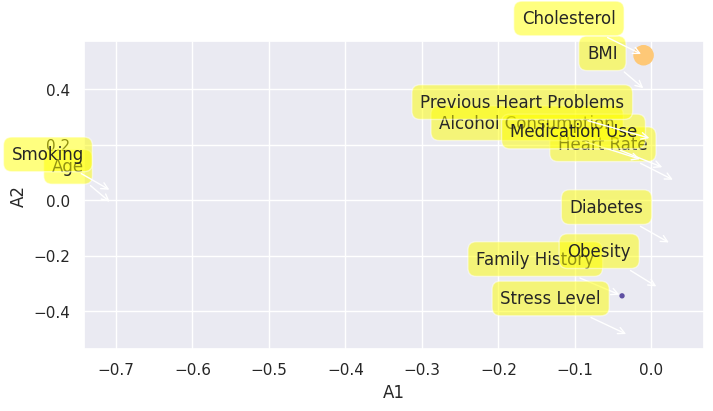

In [22]:
plt. figure(figsize=(8,4))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('A1')
plt.ylabel('A2')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree Plot and Eigenvalues**

array([1.39683884, 1.05977389, 1.03638465, 1.0257009 , 1.00849079,
       1.00382114, 0.99398114, 0.98745458, 0.97076839, 0.95891676,
       0.95678428, 0.60245421])

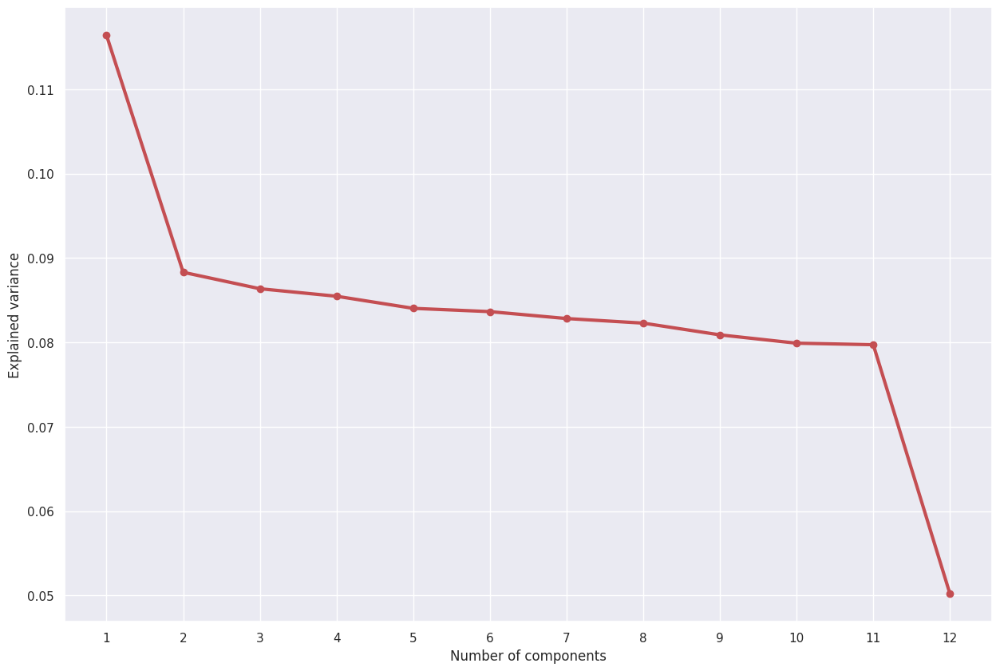

In [23]:
#Eigenvalues
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

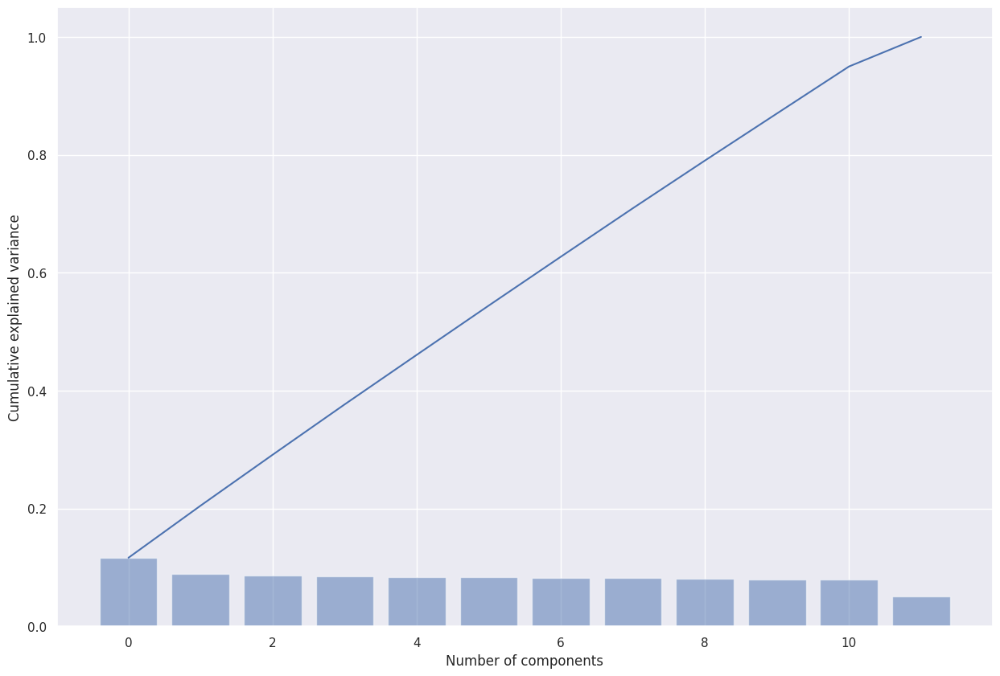

In [24]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

array([-4.34397720e-01,  1.04403474e+00,  3.83443227e-01, ...,
        3.20406246e-01,  1.23730197e-01,  3.83421681e-04])

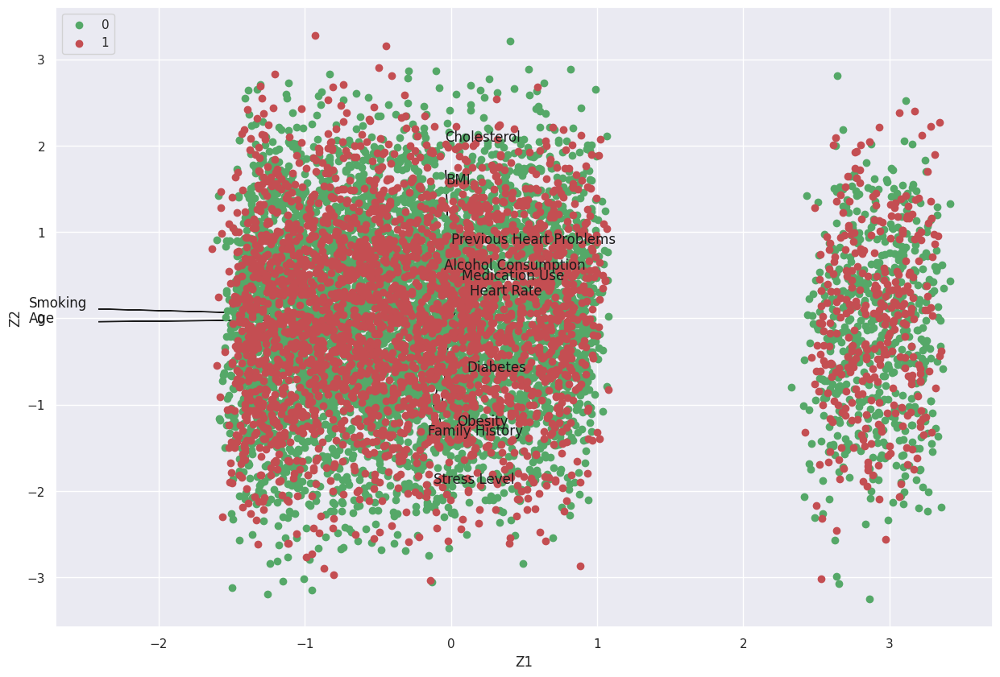

In [25]:
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('Z1')
plt.ylabel('Z2')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_0,0], Z[idx_0,1], c='g', label='0')
plt.scatter(Z[idx_1,0], Z[idx_1,1], c='r', label='1')

plt.legend(loc='upper left')
Z1
Z2

# Using PCA Library

In [26]:
!pip install pca

In [27]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [12] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [12] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [12] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[12]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [28]:
out['PC']

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
0,-0.729720,-0.434398,-0.154356,1.578582,-0.649201,0.086222,1.058831,0.503890,2.083448,0.712852,-0.173544,0.048432
1,0.877054,1.044035,-0.520511,-0.501426,1.234903,-0.565750,-1.415687,1.324206,-1.859309,-0.699180,0.922884,-1.120942
2,3.197065,0.383443,-0.487616,-0.019312,-0.465584,0.481250,1.194547,-1.567173,0.841282,-0.543315,1.586544,0.903026
3,-1.365613,0.739245,0.990570,-0.487692,0.281605,-0.633418,1.600947,1.058696,-0.466365,-0.665595,1.867451,0.862057
4,-0.637302,-0.942501,-1.263419,0.226243,0.960495,0.312867,-0.804805,0.513095,-0.689913,-0.426602,1.873428,0.188565
...,...,...,...,...,...,...,...,...,...,...,...,...
8758,-0.487214,-1.637512,1.860019,-1.317286,0.318400,-0.159407,-0.462981,-1.612482,0.551347,-0.221956,0.609200,-0.144361
8759,2.990153,-2.333991,-1.504531,0.413701,0.333583,-0.460623,0.482054,-0.175506,1.020380,0.604713,-0.653728,1.124239
8760,-0.063974,0.320406,0.278832,-0.861671,0.321947,0.944790,-0.766599,2.699912,0.038013,-0.186433,0.104664,-0.425470
8761,0.422798,0.123730,-0.241878,-0.474847,0.510359,0.467031,0.346897,-2.146377,1.007085,0.862119,0.389071,-0.943405


**Scatter plot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot: title={'center': '12 Principal Components explain [100.0%] of the variance'}, xlabel='PC1 (11.6% expl.var)', ylabel='PC2 (8.83% expl.var)'>)

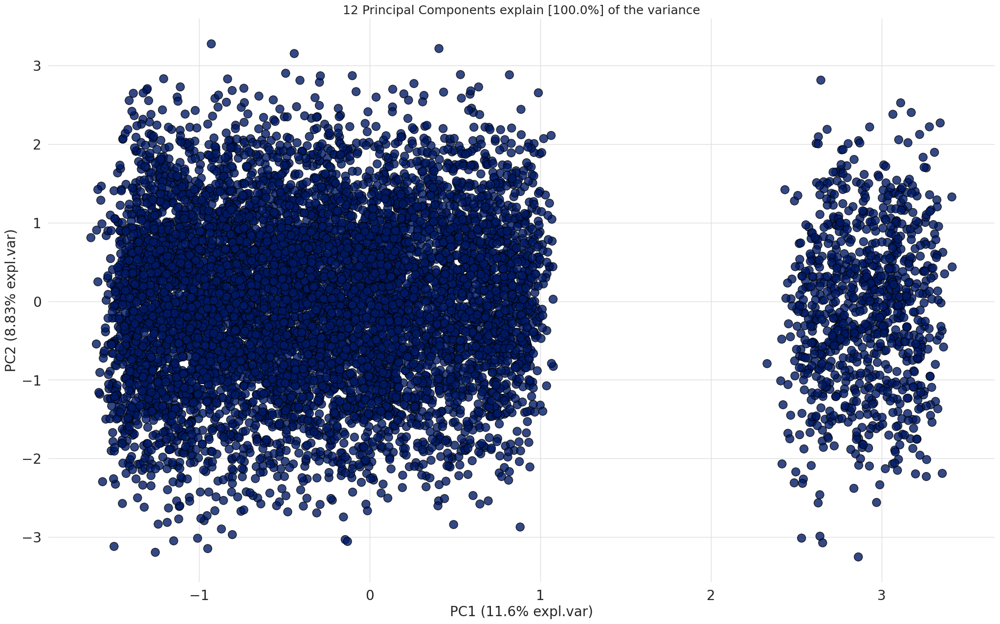

In [29]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [30]:
A = out['loadings'].T
A

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
Age,-0.705384,-0.011929,-0.030719,-0.014483,-0.024142,0.011602,-0.023474,-0.029794,0.046944,0.022007,0.003771,0.704471
BMI,-0.007854,0.397319,0.006101,-0.292869,-0.137872,0.208838,0.591882,0.388923,-0.113690,0.402452,-0.129938,0.016815
Heart Rate,0.031348,0.069551,-0.351452,-0.305906,-0.468328,-0.111931,-0.479284,0.417367,0.166551,0.068025,0.329658,-0.016561
Cholesterol,-0.010332,0.522687,-0.141936,0.379751,-0.108031,-0.055925,0.122195,0.061298,-0.412812,-0.495808,0.332511,0.045224
Family History,-0.038468,-0.344259,0.514954,0.015918,-0.011653,0.200148,-0.163903,0.260201,-0.557077,0.185487,0.367394,0.009644
Alcohol Consumption,-0.011480,0.145312,0.478238,-0.425933,-0.009697,-0.427418,-0.099302,0.213521,-0.067937,-0.440154,-0.361614,0.035704
Diabetes,0.025958,-0.157055,-0.300329,-0.417130,0.130934,-0.523776,0.228877,-0.347887,-0.386329,0.149828,0.270418,0.027303
Obesity,0.009546,-0.315838,-0.503449,-0.151978,0.173107,0.341522,-0.059383,0.257201,-0.386221,-0.309996,-0.401721,0.025911
Smoking,-0.705486,0.032943,-0.036235,-0.018242,0.015111,-0.028116,-0.013708,-0.003029,-0.036895,-0.002267,-0.015893,-0.704787
Medication Use,0.017597,0.115424,0.102186,-0.296687,-0.547312,0.406430,-0.104628,-0.596516,-0.184761,-0.088626,-0.118221,-0.020520


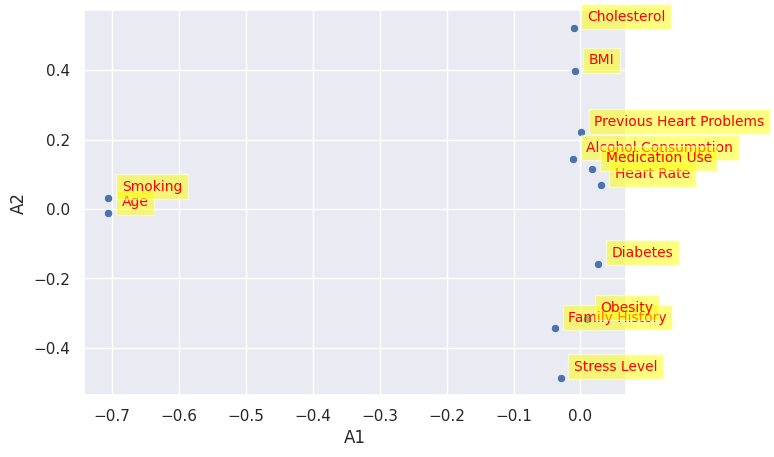

In [31]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('A1')
plt.ylabel('A2')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

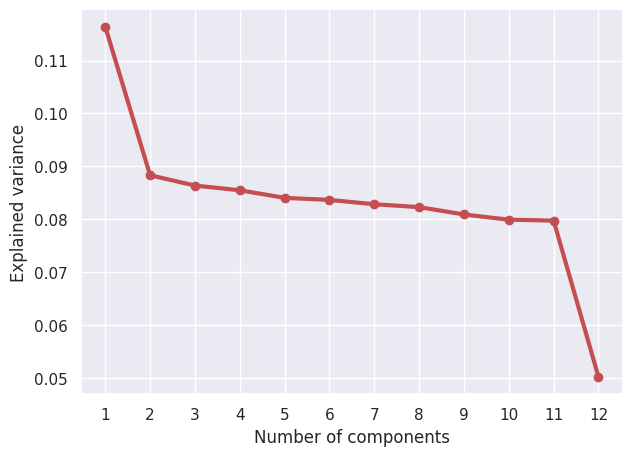

In [32]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

**Explained Variance Plot**

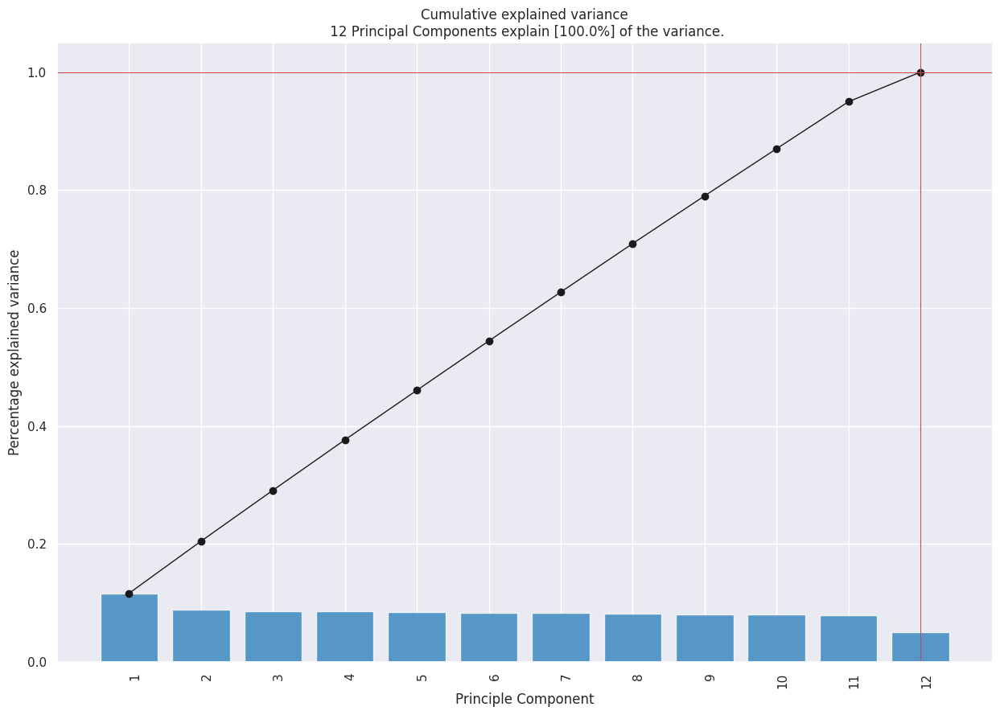

In [33]:
model.plot();

**Biplot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot: title={'center': '12 Principal Components explain [100.0%] of the variance'}, xlabel='PC1 (11.6% expl.var)', ylabel='PC2 (8.83% expl.var)'>)

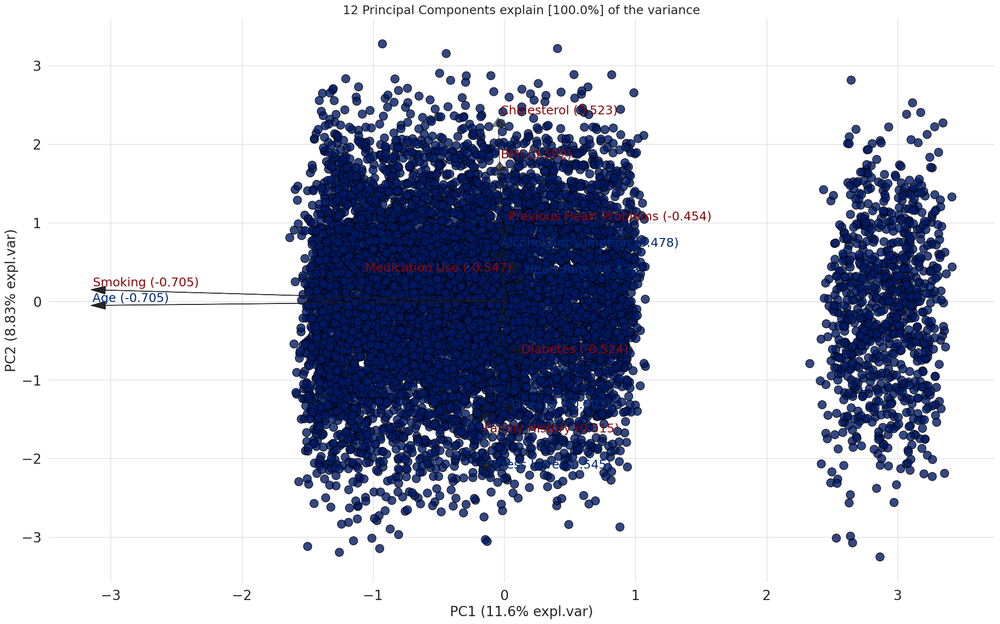

In [34]:
model.biplot(label=False, legend=False, color_arrow='k')

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


[scatterd] >INFO> Create scatterplot


(<Figure size 3000x2500 with 1 Axes>,
 <Axes3DSubplot: title={'center': '12 Principal Components explain [100.0%] of the variance'}, xlabel='PC1 (11.6% expl.var)', ylabel='PC2 (8.83% expl.var)', zlabel='PC3 (8.63% expl.var)'>)

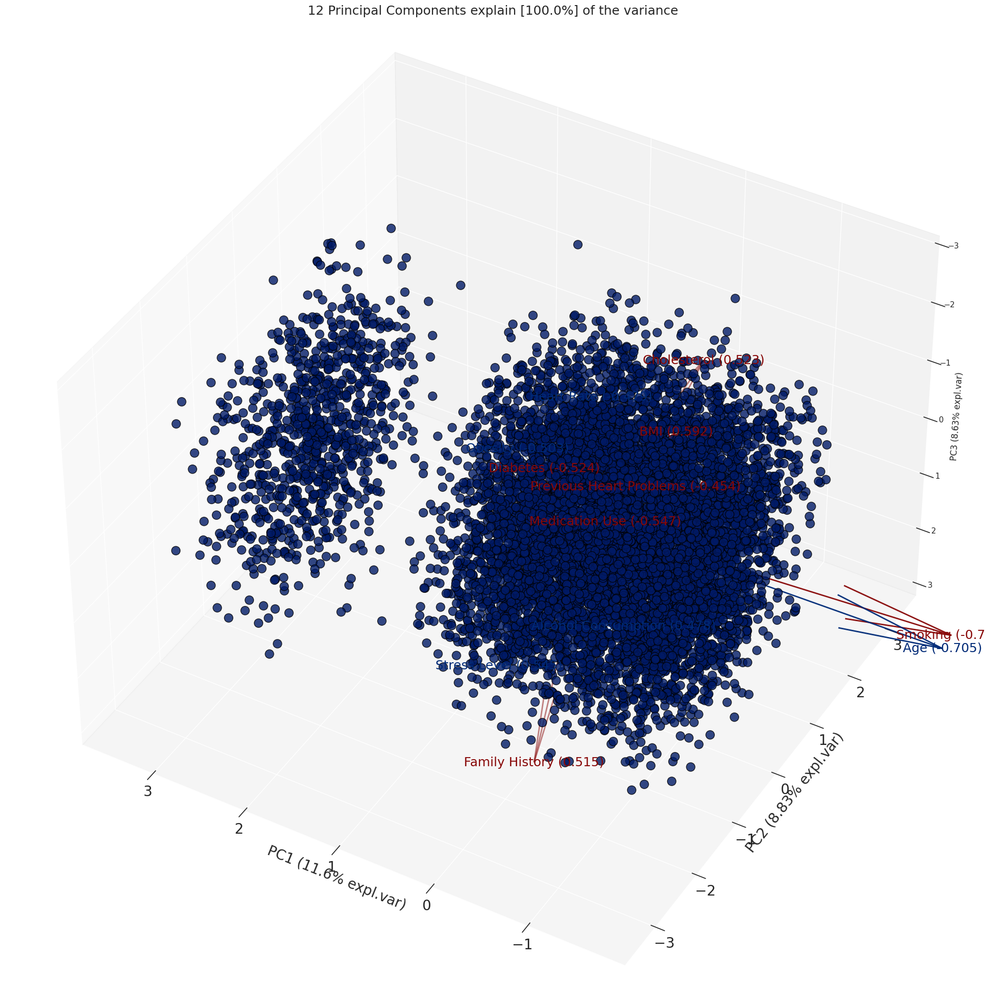

In [35]:
model.biplot3d(legend=False)

# Classification using Pycaret

At first dataset is split into train and test set with 70% and 30% ratio respectively. Then using the PyCaret compare_models() function, the models which shows the highest accuracy on the original dataset can be found. Before applying PCA, the output from compare_models() function shows that Linear Discriminant Analayis, Extra Trees Classifier, and Gradient Boosting Classifier shows the best performance.

However, after applying PCA, the these models performance decreases and Logistic Regression, K-nearest neighbour, and Quadratic Discriminant Analysis shows the highest performance. Therefore, I have taken Logistic Regression, K-nearest Neighbour and Quadratic discriminant Analysis as my classification algorithms and applied these three models on the original dataset before applying PCA and after applying PCA

In [36]:
from pycaret.utils import version
version()

'3.0.0'

In [37]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (7887, 13)
Unseen Data For Predictions: (876, 13)


In [38]:
from pycaret.classification import *
clf = setup(data=data, target='Target', train_size=0.7, session_id=123)

,Description,Value
0,Session id,123
1,Target,Target
2,Target type,Binary
3,Original data shape,"(7887, 13)"
4,Transformed data shape,"(7887, 13)"
5,Transformed train set shape,"(5520, 13)"
6,Transformed test set shape,"(2367, 13)"
7,Numeric features,12
8,Preprocess,True
9,Imputation type,simple


**Comparing All Models**

In [39]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.6408,0.4921,0.0000,0.0000,0.0000,0.0000,0.0000,1.4790
ridge,Ridge Classifier,0.6408,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1350
lda,Linear Discriminant Analysis,0.6408,0.4931,0.0000,0.0000,0.0000,0.0000,0.0000,0.1840
dummy,Dummy Classifier,0.6408,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0900
ada,Ada Boost Classifier,0.6393,0.5007,0.0045,0.2610,0.0089,-0.0003,-0.0019,0.1830
nb,Naive Bayes,0.6388,0.4898,0.0015,0.0176,0.0028,-0.0031,-0.0068,0.1480
qda,Quadratic Discriminant Analysis,0.6335,0.4884,0.0187,0.3965,0.0348,-0.0038,-0.0025,0.1550
gbc,Gradient Boosting Classifier,0.6328,0.5070,0.0217,0.3372,0.0405,-0.0036,-0.0078,0.2630
rf,Random Forest Classifier,0.6226,0.4985,0.0766,0.3762,0.1272,0.0065,0.0099,0.4630
lightgbm,Light Gradient Boosting Machine,0.6103,0.5029,0.1114,0.3602,0.1701,0.0016,0.0016,0.1470


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [40]:
best_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Logistic Regresssion**

In [41]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6413,0.4766,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.6413,0.4282,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.6413,0.5014,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.6413,0.5133,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.6413,0.5020,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.6413,0.5057,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.6413,0.4840,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.6395,0.5136,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.6395,0.5114,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Tune the model

In [42]:
tuned_lr=tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6413,0.4742,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.6413,0.4325,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.6413,0.5024,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.6413,0.5140,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.6413,0.5013,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.6413,0.5053,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.6413,0.4825,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.6395,0.5122,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.6395,0.5127,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [43]:
tuned_lr

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [44]:
!pip install --upgrade pycaret


  Using cached pycaret-3.2.0-py3-none-any.whl (484 kB)
  Attempting uninstall: pycaret
    Found existing installation: pycaret 3.0.0
    Uninstalling pycaret-3.0.0:
      Successfully uninstalled pycaret-3.0.0


Evaluate Logistic Regression

In [45]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create model with K-nearest neighbour**

In [46]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5707,0.4963,0.2576,0.3617,0.3009,0.0036,0.0037
1,0.5688,0.4777,0.2475,0.3551,0.2917,-0.0042,-0.0044
2,0.5960,0.5458,0.2626,0.4031,0.3180,0.0489,0.0511
3,0.5525,0.4811,0.2778,0.3459,0.3081,-0.0167,-0.0170
4,0.6051,0.5364,0.2980,0.4275,0.3512,0.0802,0.0829
5,0.5471,0.4825,0.2172,0.3116,0.2560,-0.0549,-0.0567
6,0.5670,0.5081,0.2929,0.3694,0.3268,0.0139,0.0141
7,0.5688,0.5073,0.2814,0.3709,0.3200,0.0130,0.0132
8,0.5598,0.4994,0.2362,0.3406,0.2789,-0.0232,-0.0240


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Tune model with K-nearest neighbour

In [47]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6395,0.4909,0.0152,0.4286,0.0293,0.0049,0.0165
1,0.6413,0.4917,0.0303,0.5000,0.0571,0.0168,0.0439
2,0.6431,0.5136,0.0101,0.6667,0.0199,0.0093,0.0475
3,0.6268,0.4994,0.0051,0.1000,0.0096,-0.0258,-0.0733
4,0.6377,0.5280,0.0101,0.3333,0.0196,-0.0015,-0.0055
5,0.6377,0.4941,0.0253,0.4167,0.0476,0.0069,0.0180
6,0.6449,0.4919,0.0253,0.6250,0.0485,0.0213,0.0673
7,0.6304,0.4857,0.0151,0.2727,0.0286,-0.0096,-0.0261
8,0.6377,0.4892,0.0151,0.4286,0.0291,0.0047,0.0161


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [48]:
tuned_knn

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=50, p=2,
                     weights='uniform')

Evaluate model with K-nearest neighbour

In [49]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create model with Quadratic Discriminant Analysis**

In [50]:
qda=create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6395,0.5187,0.0303,0.4615,0.0569,0.0133,0.0333
1,0.6033,0.4380,0.0253,0.1613,0.0437,-0.0592,-0.1004
2,0.6359,0.5028,0.0000,0.0000,0.0000,-0.0108,-0.0553
3,0.6341,0.4852,0.0303,0.3750,0.0561,0.0026,0.0059
4,0.6431,0.5137,0.0051,1.0000,0.0101,0.0065,0.0570
5,0.6377,0.4962,0.0152,0.3750,0.0291,0.0013,0.0041
6,0.6377,0.4790,0.0354,0.4375,0.0654,0.0125,0.0284
7,0.6413,0.4986,0.0151,0.6000,0.0294,0.0120,0.0477
8,0.6377,0.4821,0.0251,0.4545,0.0476,0.0102,0.0279


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Tune QDA Model

In [51]:
tuned_qda=tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6413,0.5353,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.6395,0.4767,0.0000,0.0000,0.0000,-0.0036,-0.0319
2,0.6395,0.5122,0.0000,0.0000,0.0000,-0.0036,-0.0319
3,0.6413,0.4982,0.0051,0.5000,0.0100,0.0028,0.0178
4,0.6413,0.5143,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.6413,0.4998,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.6413,0.5096,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.6395,0.4972,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.6377,0.4800,0.0000,0.0000,0.0000,-0.0036,-0.0320


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [52]:
tuned_qda

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.17,
                              store_covariance=False, tol=0.0001)

Evaluate QDA Model

In [53]:
evaluate_model(tuned_qda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# Classification + PCA

In [54]:
!pip install statsmodels --upgrade

In [55]:
clf_pca = setup(data=data, target='Target', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,Session id,123
1,Target,Target
2,Target type,Binary
3,Original data shape,"(7887, 13)"
4,Transformed data shape,"(7887, 4)"
5,Transformed train set shape,"(5520, 4)"
6,Transformed test set shape,"(2367, 4)"
7,Numeric features,12
8,Preprocess,True
9,Imputation type,simple


Comparing Models

In [56]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.6408,0.5019,0.0000,0.0000,0.0000,0.0000,0.0000,0.1760
nb,Naive Bayes,0.6408,0.4968,0.0000,0.0000,0.0000,0.0000,0.0000,0.1980
svm,SVM - Linear Kernel,0.6408,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1940
ridge,Ridge Classifier,0.6408,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1830
qda,Quadratic Discriminant Analysis,0.6408,0.4927,0.0000,0.0000,0.0000,0.0000,0.0000,0.2140
lda,Linear Discriminant Analysis,0.6408,0.5019,0.0000,0.0000,0.0000,0.0000,0.0000,0.1650
dummy,Dummy Classifier,0.6408,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1230
ada,Ada Boost Classifier,0.6377,0.4958,0.0045,0.2667,0.0088,-0.0036,-0.0133,1.0290
gbc,Gradient Boosting Classifier,0.6353,0.4959,0.0176,0.3353,0.0334,-0.0009,-0.0042,0.8200
lightgbm,Light Gradient Boosting Machine,0.6062,0.4984,0.1039,0.3399,0.1589,-0.0099,-0.0134,1.0020


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

Best model with PCA

In [57]:
best_model_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

Tune Best Model

In [58]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6413,0.4506,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.6413,0.4648,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.6413,0.4906,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.6413,0.5104,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.6413,0.4911,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.6413,0.5231,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.6413,0.5211,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.6395,0.4987,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.6395,0.5309,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


Evaluate Best Model

In [59]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [60]:
lr_pca = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6413,0.4506,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.6413,0.4647,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.6413,0.4905,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.6413,0.5104,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.6413,0.4911,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.6413,0.5231,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.6413,0.5211,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.6395,0.4987,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.6395,0.5309,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [61]:
tuned_lr_pca = tune_model(lr_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6413,0.4506,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.6413,0.4648,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.6413,0.4906,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.6413,0.5104,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.6413,0.4911,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.6413,0.5231,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.6413,0.5211,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.6395,0.4987,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.6395,0.5309,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [62]:
tuned_lr_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [63]:
evaluate_model(tuned_lr_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [64]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5634,0.4896,0.2323,0.3407,0.2763,-0.0205,-0.0213
1,0.5725,0.5009,0.2727,0.3699,0.3140,0.0136,0.0140
2,0.5525,0.4574,0.2323,0.3262,0.2714,-0.0385,-0.0396
3,0.5707,0.4920,0.2172,0.3440,0.2663,-0.0157,-0.0166
4,0.5761,0.5172,0.2576,0.3696,0.3036,0.0127,0.0131
5,0.5598,0.4808,0.2424,0.3404,0.2832,-0.0217,-0.0223
6,0.5399,0.4594,0.2525,0.3205,0.2825,-0.0492,-0.0500
7,0.5851,0.5343,0.2563,0.3864,0.3082,0.0289,0.0302
8,0.5489,0.4708,0.1859,0.2984,0.2291,-0.0660,-0.0696


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [65]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6413,0.4800,0.0152,0.5000,0.0294,0.0085,0.0309
1,0.6359,0.4647,0.0051,0.2000,0.0099,-0.0080,-0.0316
2,0.6304,0.4720,0.0051,0.1250,0.0097,-0.0187,-0.0591
3,0.6322,0.4593,0.0152,0.2727,0.0287,-0.0094,-0.0256
4,0.6413,0.5010,0.0202,0.5000,0.0388,0.0113,0.0357
5,0.6413,0.4706,0.0152,0.5000,0.0294,0.0085,0.0309
6,0.6377,0.4835,0.0253,0.4167,0.0476,0.0069,0.0180
7,0.6304,0.5069,0.0201,0.3077,0.0377,-0.0068,-0.0171
8,0.6341,0.4498,0.0101,0.2857,0.0194,-0.0052,-0.0177


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [66]:
tuned_knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=50, p=2,
                     weights='uniform')

In [67]:
evaluate_model(tuned_knn_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [68]:
qda_pca = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6413,0.4612,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.6413,0.4618,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.6413,0.4950,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.6413,0.5016,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.6413,0.4722,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.6413,0.5324,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.6413,0.4758,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.6395,0.4907,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.6395,0.5276,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [69]:
tuned_qda_pca = tune_model(qda_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6413,0.4488,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.6413,0.4598,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.6413,0.4848,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.6413,0.5097,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.6413,0.4893,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.6413,0.5246,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.6413,0.5106,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.6395,0.4959,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.6395,0.5305,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [70]:
tuned_qda_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

In [71]:
evaluate_model(tuned_qda_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [72]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6123,0.5090,0.1566,0.3974,0.2246,0.0275,0.0328
1,0.5779,0.4705,0.1768,0.3333,0.2310,-0.0234,-0.0256
2,0.5870,0.4926,0.1515,0.3333,0.2083,-0.0204,-0.0233
3,0.6014,0.4903,0.1869,0.3854,0.2517,0.0228,0.0256
4,0.5978,0.4828,0.1616,0.3636,0.2238,0.0039,0.0045
5,0.5870,0.5160,0.1970,0.3611,0.2549,0.0023,0.0025
6,0.5743,0.4800,0.1465,0.3053,0.1980,-0.0452,-0.0508
7,0.6159,0.5228,0.2111,0.4330,0.2838,0.0622,0.0697
8,0.5870,0.4408,0.1407,0.3294,0.1972,-0.0237,-0.0276


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [73]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6413,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.6413,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.6413,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.6413,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.6413,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.6413,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.6413,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.6395,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.6395,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [74]:
tuned_et_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='gini', max_depth=3, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.1, min_samples_leaf=4,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=70, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

In [75]:
evaluate_model(tuned_et_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [76]:
 !pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 8.1 MB/s eta 0:00:00


In [77]:
import shap